# Exam Project

### Downsampling image size

In [1]:
from PIL import Image
import os 
import paralleltomo #We had to change float to float32


import numpy as np
from PIL import Image
import matplotlib.pyplot as plt 

C:\Users\Owner\Desktop\exam_project\paralleltomo.py:102: RuntimeWarning: divide by zero encountered in true_divide
  tx = (x - x0theta[j,0])/a


Load image and get values from array

In [49]:
import numpy as np

# Load the NumPy array from the file
array_data = np.load('testImage.npy')

# Get the unique values and their counts
unique_values, value_counts = np.unique(array_data, return_counts=True)

# Print the unique values and their counts
for value, count in zip(unique_values, value_counts):
    print(f"Value: {value}, Count: {count}")


Value: 0.0, Count: 5365197
Value: 0.0008496388523324683, Count: 19632289
Value: 0.0037101005066195736, Count: 1257
Value: 0.05397851616202787, Count: 1257


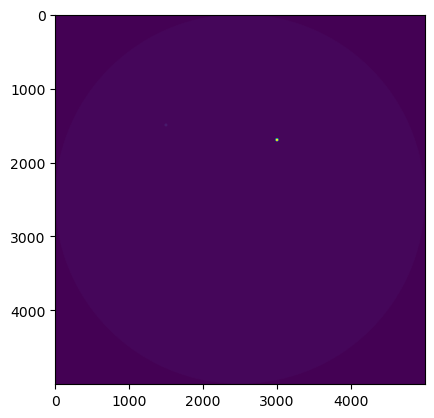

C:\Users\Owner\AppData\Local\Temp\ipykernel_13468\4230183708.py:9: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img = img.resize((50,50), Image.LANCZOS)


(50, 50)


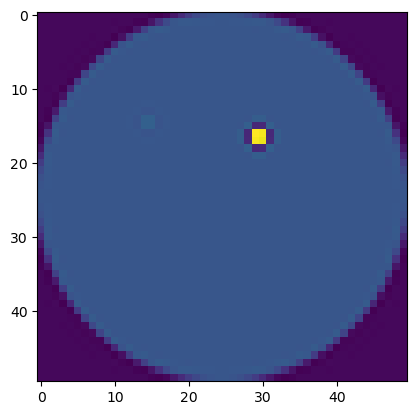

In [101]:
# Load image and convert it to a PIL Image object
img_array = np.load("testImage.npy")
img = Image.fromarray(img_array)
# show the image using matplotlib
plt.imshow(img_array)
plt.show()

# Resize the image from 5000x5000 pixels to 50x50 pixels
img = img.resize((50,50), Image.LANCZOS)

# Convert image again from PIL to numpy
img_array = np.array(img)

print(img_array.shape)
plt.imshow(img_array)
plt.show()

Lanczos is a resampling algorithm that is commonly used for image resizing in digital image processing. It is a type of low-pass filter that reduces the size of an image by averaging the pixel values in a way that reduces the loss of detail and sharpness in the image.

The Lanczos algorithm works by using a mathematical function called the Lanczos kernel to create a weighted average of nearby pixels. This kernel is designed to smooth out the image while preserving sharp edges and fine details. The size of the kernel (also known as the "window") determines the degree of smoothing applied to the image.

The Lanczos algorithm produces high-quality results, but it can be computationally intensive, especially for large images. However, the trade-off between quality and computational cost is often considered worthwhile, especially for applications where image quality is critical.

In the context of the Python Imaging Library (PIL) and its fork Pillow, the Image.LANCZOS filter is one of several resampling filters that can be used with the resize() method to downsample or upsample an image. The Image.LANCZOS filter is generally considered to produce high-quality results, but it may be slower than other filters like Image.ANTIALIAS.

## Paralleltomo

In [102]:
import numpy as np
#N=50/np.sqrt(2)
#[A,theta,p,d] = paralleltomo.paralleltomo(N)
N=50
theta =np.matrix(range(0,180,3)) #range creates a sequence of numbers that starts at 0, increments by 1, and ends at 179. Creates 180 elements. The first element is 0, the second element is 1, and so on, up to the 180th element, which is 179.
p=100

[A,theta,p,d] = paralleltomo.paralleltomo(N, theta, p)

rank = np.linalg.matrix_rank(A)
print(rank)
print(A.shape)

2500
(6000, 2500)


In [103]:
import matplotlib.pyplot as plt

x=img_array.flatten()
b=np.dot(A,x)

x_reconstructed, residuals, rank, s = np.linalg.lstsq(A,b, rcond=None)
print(x_reconstructed)



[-3.65257918e-17  4.16333634e-17 -1.28369537e-16 ...  6.50521303e-19
 -1.08420217e-18 -1.08420217e-18]


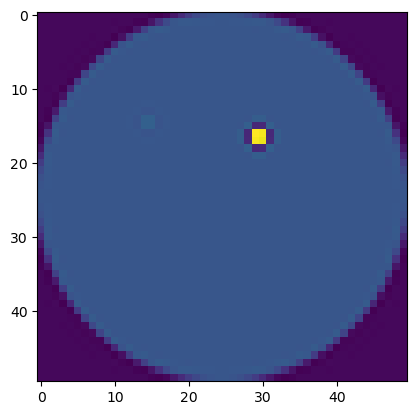

[ 6.48611963e-05  4.29587464e-06 -1.78086842e-06 ... -1.72093070e-04
 -9.07465079e-05 -3.45504606e-05]


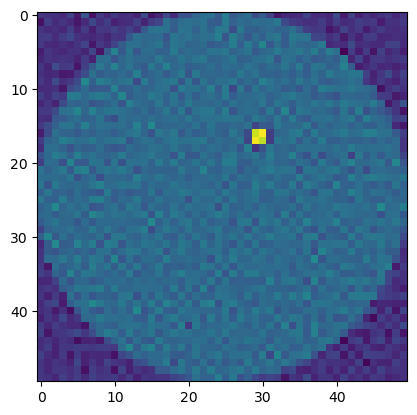

In [107]:
img_array = np.load("testImage.npy")
img = Image.fromarray(img_array)
# calculate the original shape of the image
orig_shape = (50,50)
# reshape the flattened image to the original shape
recovered_img_x = x_reconstructed.reshape(orig_shape)
# convert the image back to PIL Image format
recovered_img_x = np.array(recovered_img_x)
plt.imshow(recovered_img_x )
plt.show()


#ADD NOISE
noise= np.random.normal(0,0.001, b.shape)
b_noise= b + noise
x_noise, residuals_noise, rank_noise, s = np.linalg.lstsq(A,b_noise, rcond=None)
print(x_noise)

# reshape the flattened image to the original shape
recovered_img_x_noise = x_noise.reshape(orig_shape)
# convert the image back to PIL Image format
recovered_img_x_noise = np.array(recovered_img_x_noise)
plt.imshow(recovered_img_x_noise)
plt.show()


Try out different settings of Paralleltomo (angles, number of rays, etc.), different noise levels, and different resolutions of the test image.


# Different scenarios using regular method just different resample sizes, number of angles, and number of rays

Grid of 50 X 50
1 / 2
2 / 2
Grid of 100 X 100
1 / 2
2 / 2


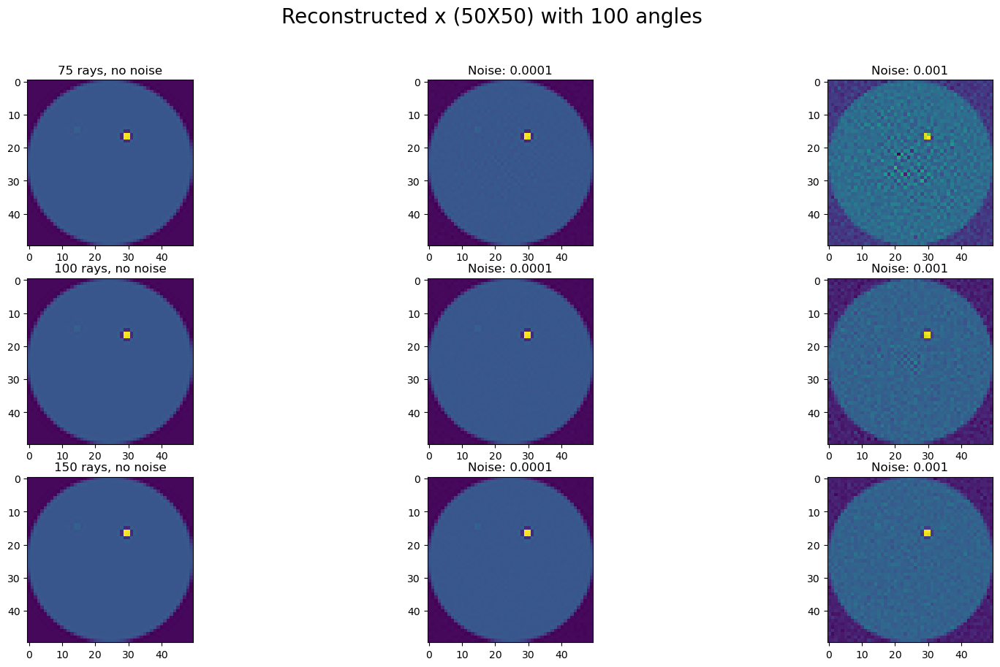

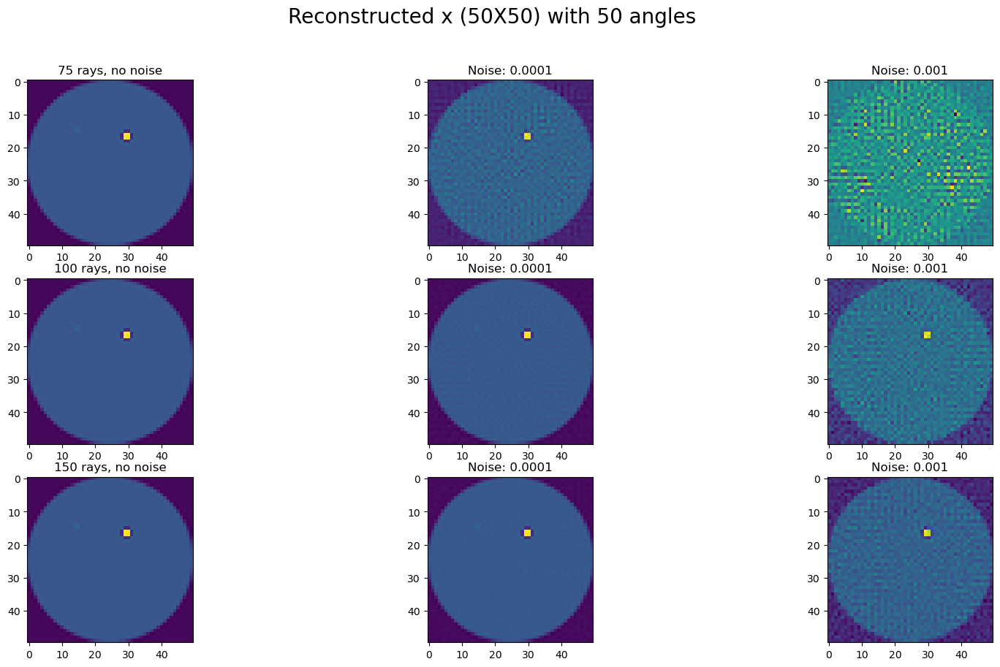

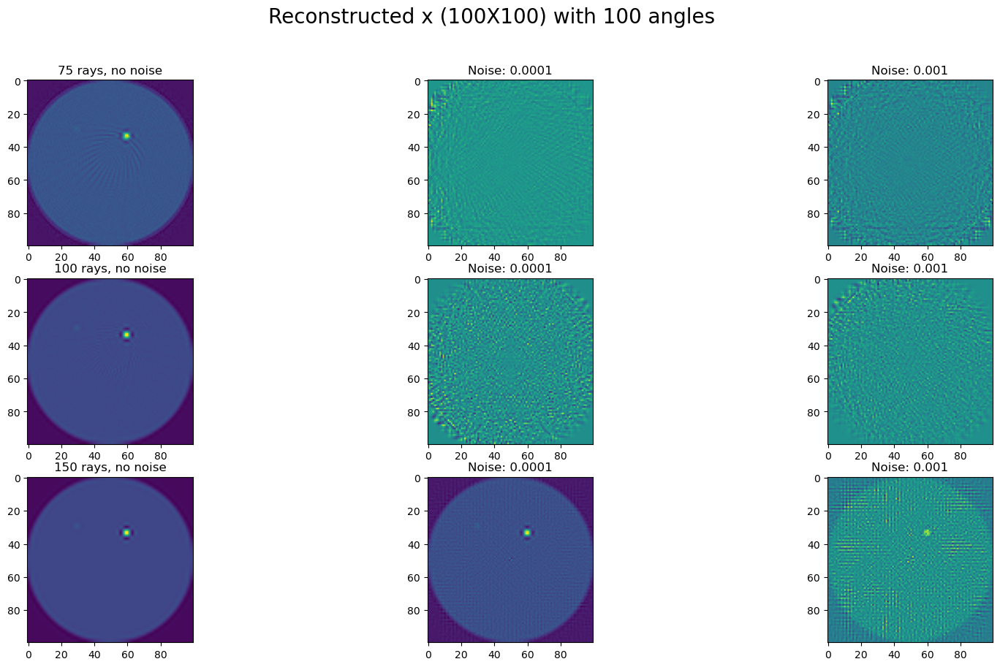

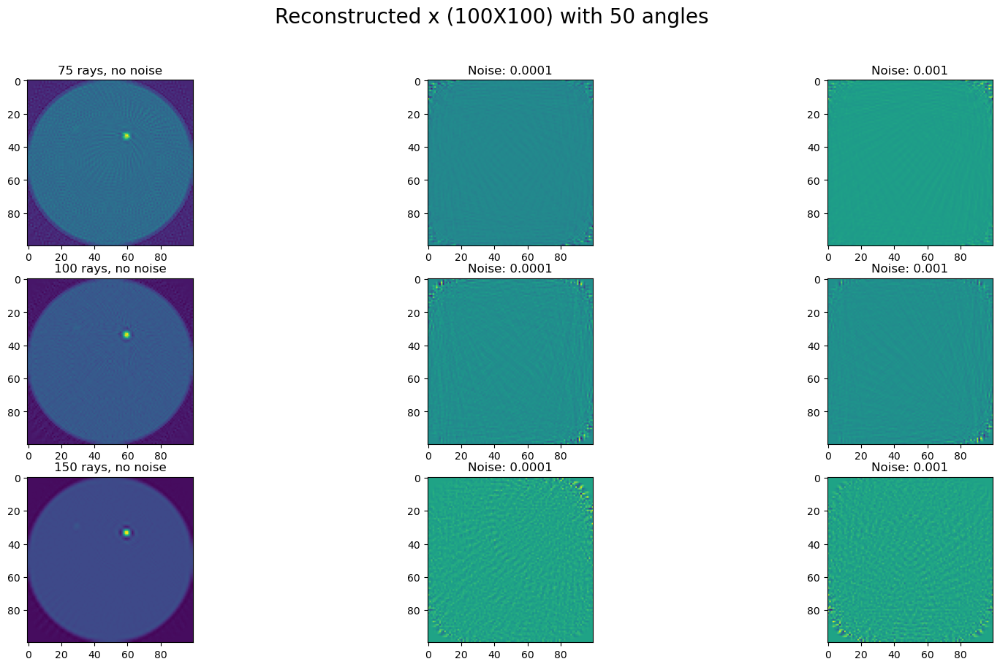

In [8]:
# Load the image with lead and steel shot
import matplotlib.pyplot as plt


# Load image and convert it to a PIL Image object
img_array = np.load("testImage.npy")
img = Image.fromarray(img_array)

#Parameters to resample x, the values divided by 2 give N, to form an NXN grid
# for example, first value 50 will give a 25x25 grid
#modify and/or add as you want, just note that the bigger the grid the more it will last running

resample_x = [100,200]

test = []


for i in resample_x:

    L = int(i/2)
    # Resize the image from 5000x5000 pixels to 50x50 pixels
    img = img.resize((L, L), Image.Resampling.LANCZOS)

    # Convert image again from PIL to numpy
    img_array = np.array(img)
    x=img_array.flatten()
    N = img_array.shape[0]
    print(f'Grid of {L} X {L}')
    
    #You can modify and/or add more variations for the next parameters
    
    
    #These are the number of angles that we may use, we will later on use np.linspace() that will give a number 
    # values between 0 and 180

    angles = [100,50]
    
    #number of rays for each angle
    rays = [75,100,150]
    
    #amount of noise
    noises = [1e-4, 1e-3]
    
    #ignore
    pt=0
    
    test1 = []
    
    for j in angles:
        
        #create figure for subplots for each number of angles
        fig, axs = plt.subplots(len(rays),len(noises)+1, figsize=(20, 10), facecolor='w', edgecolor='k')
        #fig.subplots_adjust()
        fig.suptitle(f'Reconstructed x ({L}X{L}) with {j} angles', fontsize=20)
        axs = axs.ravel()
        ax = 0
        
        
        for n in rays:
            
            #set parameters for paralleltomo
            
            theta_i = np.matrix(np.linspace(0,180,j))
            p=n
            
            #paralleltomo
            [A,thetar,pr,d] = paralleltomo.paralleltomo(N, theta_i, p)
            
            #obtain b
            b=np.dot(A,x)

            x_reconstructed, residuals, rank, s = np.linalg.lstsq(A,b, rcond = None)
            
            orig_shape = (N, N)
            # reshape the flattened image to the original shape
            recovered_img_x = x_reconstructed.reshape(orig_shape)
            # convert the image back to PIL Image format
            recovered_img_x = np.array(recovered_img_x)
            
            cond = np.linalg.cond(A, 2)
            #print(f'condition number: {cond}')

            r_v = (A@x_reconstructed)-b
            A_inv = np.linalg.pinv(A)
            deltax_norm= (np.linalg.norm(-A_inv@r_v))
            rel_res = (np.linalg.norm(r_v))/((np.linalg.norm(A))*(np.linalg.norm(x)))               
            rel_error = (np.linalg.norm(deltax_norm))/(np.linalg.norm(x))
            
            
            axs[ax].imshow(recovered_img_x )
            #txt = str(f'CN of A: {cond}'
                      #f',relative error/residuals:'
                      #f' {rel_error}, {rel_res}')
            #axs[ax].text(.5, .05, txt, ha='right', va='bottom')
            axs[ax].set_title(f'{p} rays, no noise')
            
            test1.append([cond,rel_res, rel_error])
            

            #print('it gives a condition number greater or equal than:')
            #print(leh/rih)
    
            ax+=1
            for a in noises:
                
              #ADD NOISE
                noise=np.random.normal(0,a, b.shape)
                b_noise= b + noise
                x_noise, residuals, rank, s = np.linalg.lstsq(A,b_noise, rcond=None)
                
                # reshape the flattened image to the original shape
                recovered_img_x_noise = x_noise.reshape(orig_shape)
                # convert the image back to PIL Image format
                recovered_img_x_noise = np.array(recovered_img_x_noise)
                
                cond = np.linalg.cond(A, 2)
                #print(f'condition number: {cond}')

                r_v = (A@x_noise)-b
                A_inv = np.linalg.pinv(A)
                deltax_norm= (np.linalg.norm(-A_inv@r_v))
                rel_res = (np.linalg.norm(r_v))/((np.linalg.norm(A))*(np.linalg.norm(x)))               
                rel_error = (np.linalg.norm(deltax_norm))/(np.linalg.norm(x))
                EMF = rel_error/rel_res
                
                test1.append([EMF, rel_res, rel_error])
                axs[ax].imshow(recovered_img_x_noise)
                #txt = str(f'CN =>:{cond}'
                          #f'Relative error/residuals='
                          #f' {rel_error}, {rel_res}')
                #axs[ax].text(.5, .05, txt, ha='right', va='bottom')
                axs[ax].set_title(f'Noise: {a}')
                ax+=1

        pt+=1 
        print(f'{pt} / {len(angles)}')
        #pt+=1
                                  
    test.append([test1])
        
 

# Using airtools rzr() to optimize matrix A helping it be less sensible to noise, and kaczmarz() for a better x reconstruction

Grid of 50 X 50


C:\Users\Owner\Desktop\exam_project\paralleltomo.py:102: RuntimeWarning: divide by zero encountered in true_divide
  tx = (x - x0theta[j,0])/a


Iteration 0,  ||residual|| = 0.31
Iteration 0,  ||residual|| = 0.31
Iteration 0,  ||residual|| = 0.32
Iteration 0,  ||residual|| = 0.32


C:\Users\Owner\Desktop\exam_project\paralleltomo.py:102: RuntimeWarning: invalid value encountered in true_divide
  tx = (x - x0theta[j,0])/a


Iteration 0,  ||residual|| = 0.15
Iteration 0,  ||residual|| = 0.15
Iteration 0,  ||residual|| = 0.15
Iteration 0,  ||residual|| = 0.16
Iteration 0,  ||residual|| = 0.17
Iteration 0,  ||residual|| = 0.17
Iteration 0,  ||residual|| = 0.17
Iteration 0,  ||residual|| = 0.19
1 / 3
Iteration 0,  ||residual|| = 0.29
Iteration 0,  ||residual|| = 0.29
Iteration 0,  ||residual|| = 0.29
Iteration 0,  ||residual|| = 0.29
Iteration 0,  ||residual|| = 0.14
Iteration 0,  ||residual|| = 0.14
Iteration 0,  ||residual|| = 0.14
Iteration 0,  ||residual|| = 0.15
Iteration 0,  ||residual|| = 0.16
Iteration 0,  ||residual|| = 0.16
Iteration 0,  ||residual|| = 0.17
Iteration 0,  ||residual|| = 0.18
2 / 3
Iteration 0,  ||residual|| = 0.22
Iteration 0,  ||residual|| = 0.22
Iteration 0,  ||residual|| = 0.23
Iteration 0,  ||residual|| = 0.23
Iteration 0,  ||residual|| = 0.11
Iteration 0,  ||residual|| = 0.11
Iteration 0,  ||residual|| = 0.11
Iteration 0,  ||residual|| = 0.12
Iteration 0,  ||residual|| = 0.13
It

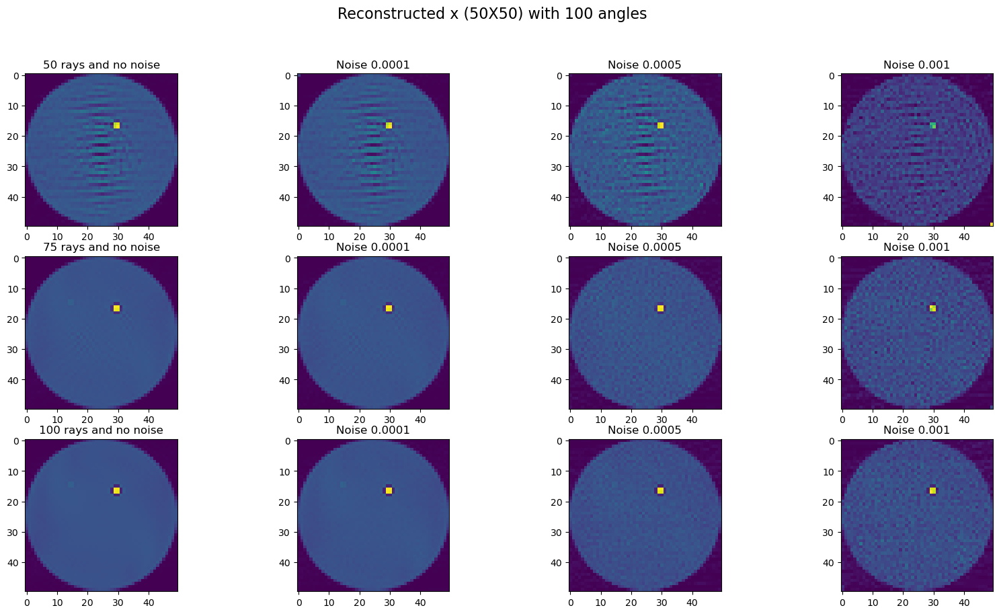

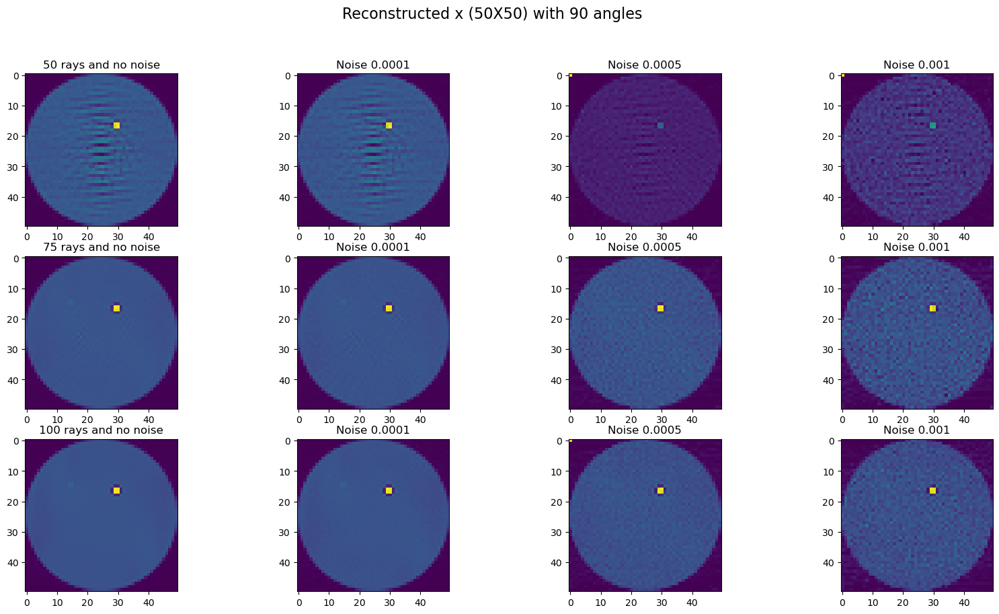

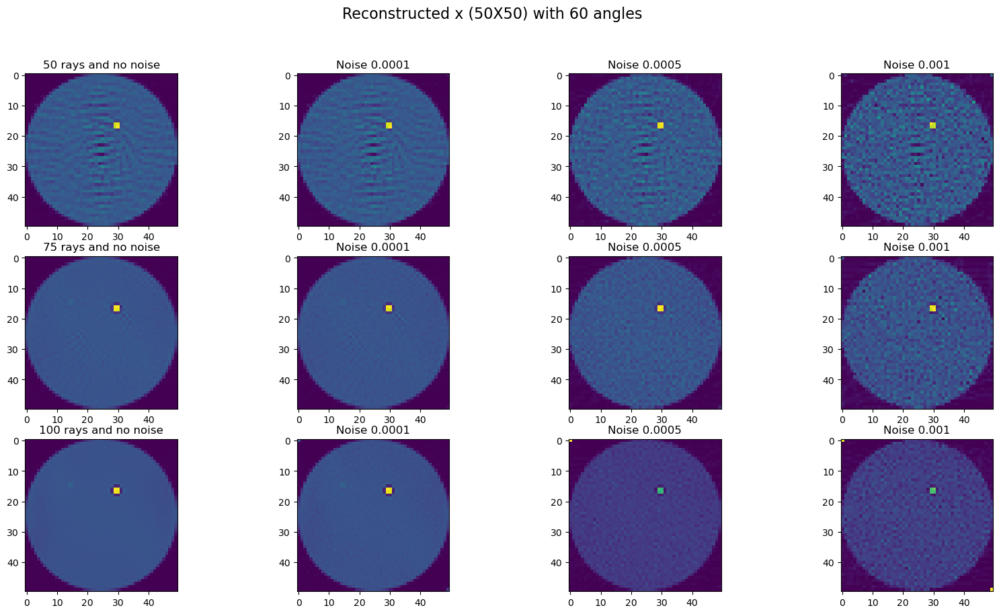

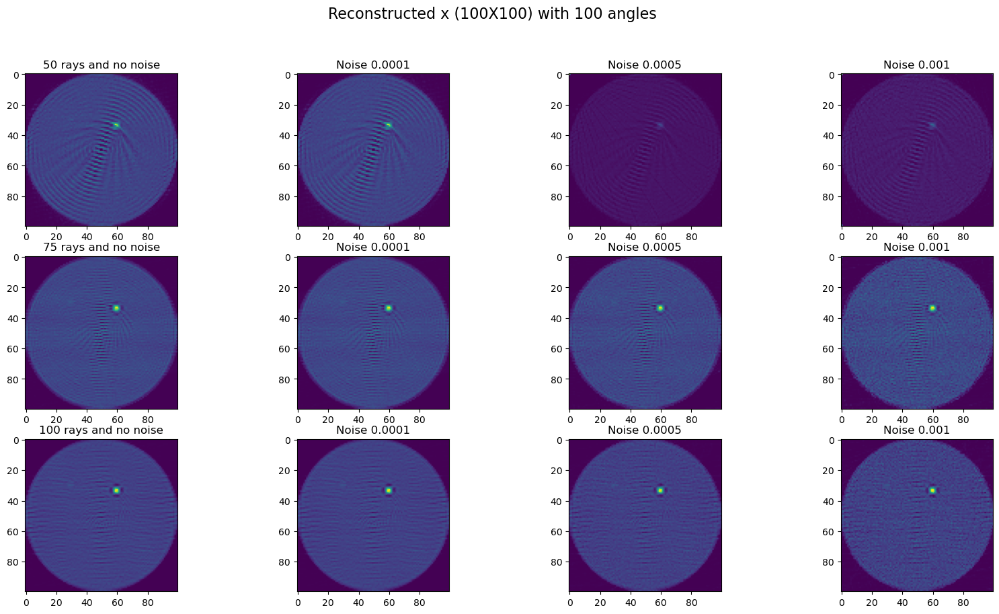

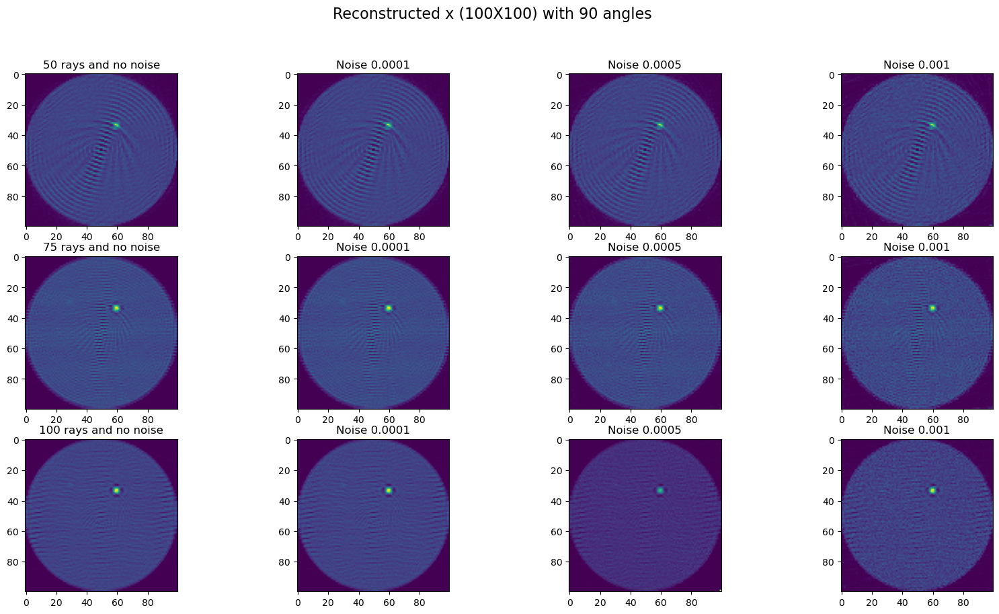

...

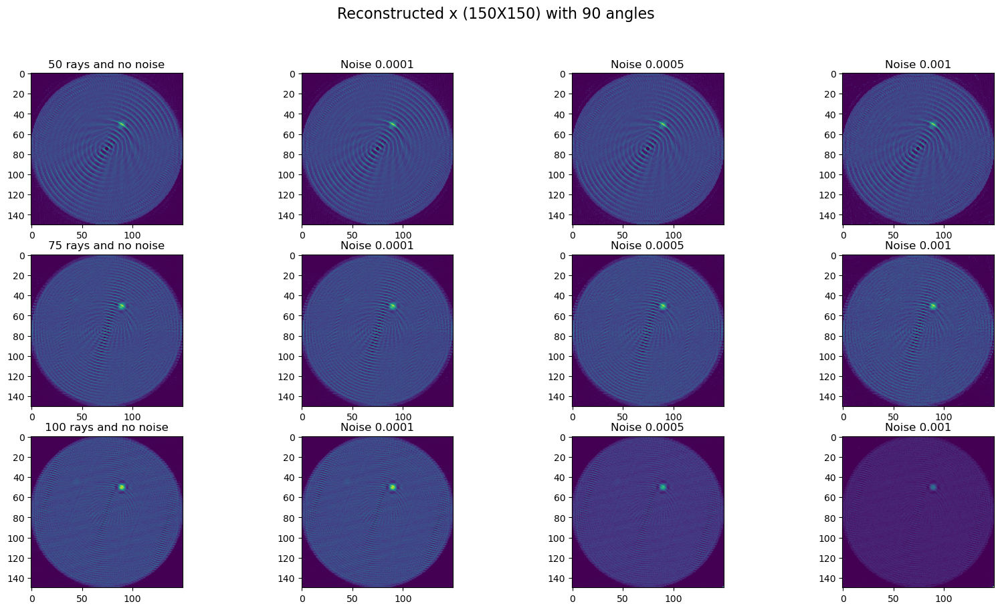

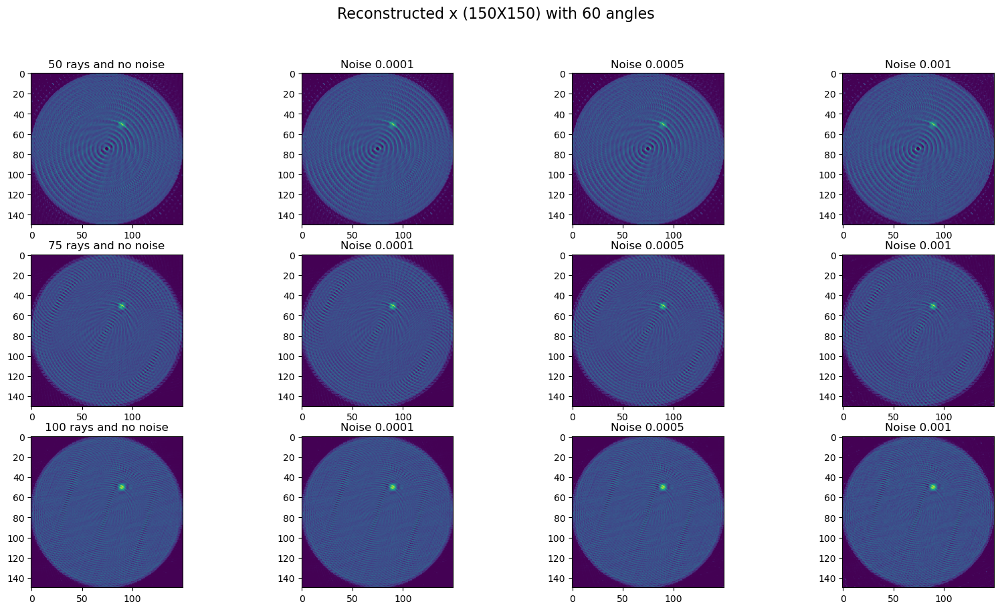

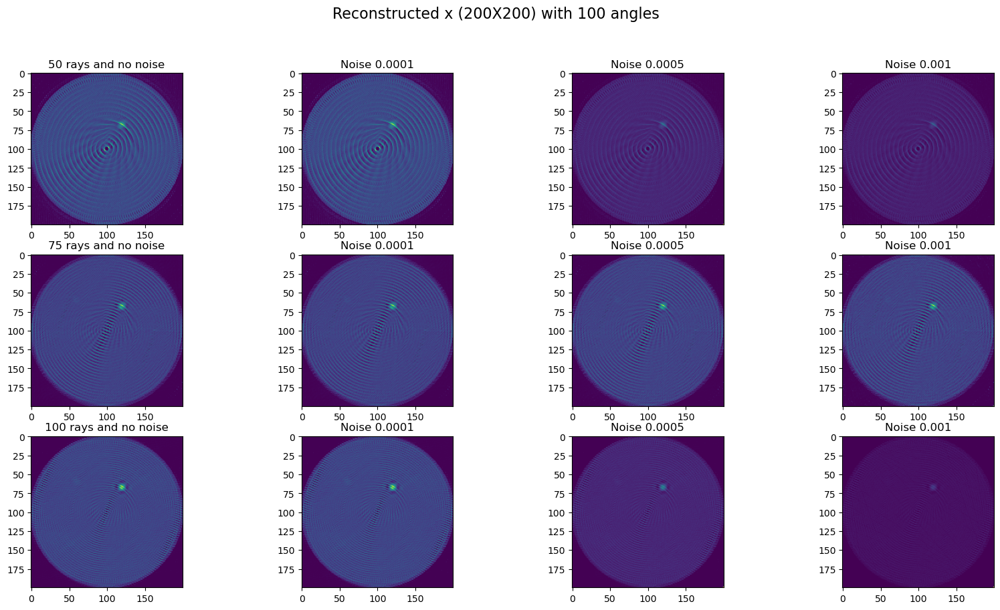

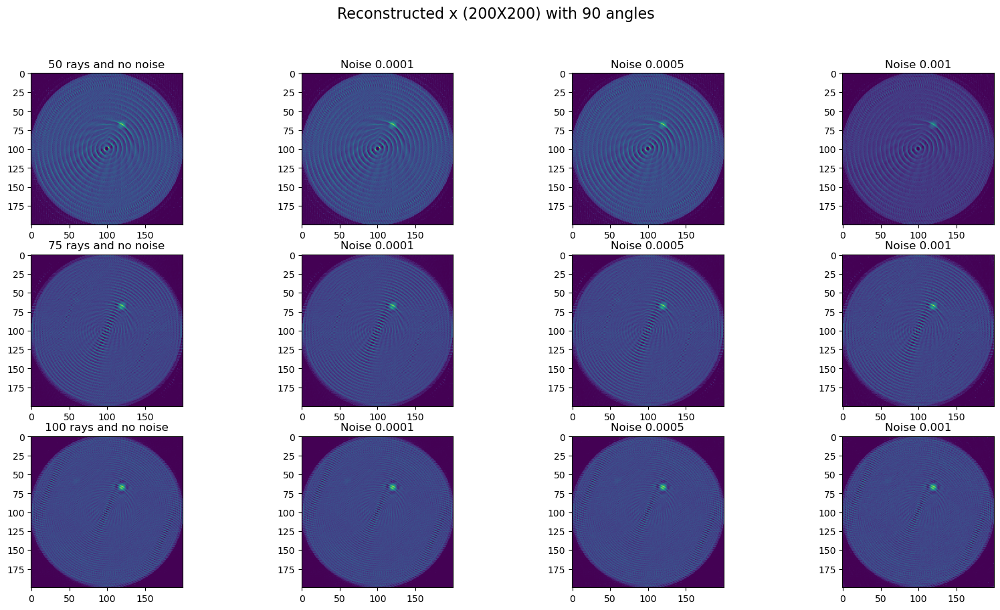

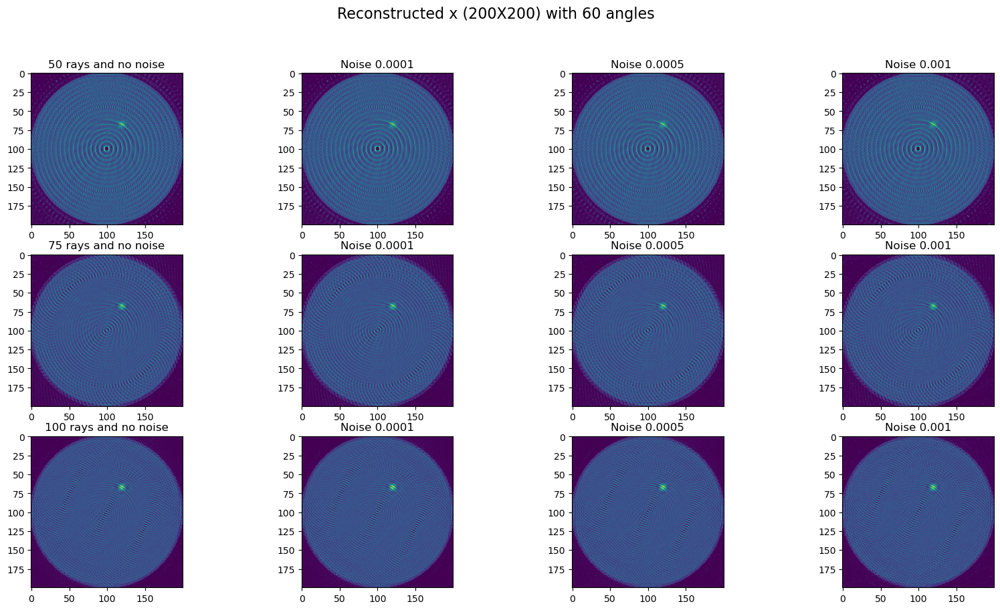

In [2]:
# Load the image with lead and steel shot
import matplotlib.pyplot as plt
import airtools



# Load image and convert it to a PIL Image object
img_array = np.load("testImage.npy")
img = Image.fromarray(img_array)

#Parameters to resample x, the values divided by 2 give N, to form an NXN grid
# for example, first value 50 will give a 25x25 grid
#modify and/or add as you want, just note that the bigger the grid the more it will last running

resample_x = [100,200,300,400]

testA = []

for i in resample_x:

    L = int(i/2)
    # Resize the image from 5000x5000 pixels to 50x50 pixels
    img = img.resize((L, L), Image.Resampling.LANCZOS)

    # Convert image again from PIL to numpy
    img_array = np.array(img)
    x=img_array.flatten()
    N = img_array.shape[0]
    print(f'Grid of {L} X {L}')
    
    #You can modify and/or add more variations for the next parameters
    
    
    #These are the number of angles that we may use, we will later on use np.linspace() that will give a number 
    # values between 0 and 180

    angles = [100,90,60]
    
    #number of rays for each angle
    rays = [50,75,100]
    
    #amount of noise
    noises = [1e-4, 5e-4, 1e-3]
    
    #ignore
    pt=0
    testA1 = []
    
    for j in angles:
        
        #create figure for subplots for each number of angles
        fig, axs = plt.subplots(len(rays),len(noises)+1, figsize=(20, 10), facecolor='w', edgecolor='k')
        fig.subplots_adjust(hspace = .2)
        fig.suptitle(f'Reconstructed x ({L}X{L}) with {j} angles', fontsize=16)
        axs = axs.ravel()
        ax = 0
        
        for n in rays:
            
            #set parameters for paralleltomo
            
            theta_i = np.matrix(np.linspace(0,180,j))
            p=n
            
            #paralleltomo
            [A,thetar,pr,d] = paralleltomo.paralleltomo(N, theta_i, p)
            
            #obtain b
            b=np.dot(A,x)
            
            A, b, som = airtools.rzr(A,b)
            #condA = np.linalg.cond(A)
            x_reconstructed, residuals = airtools.kaczmarz(A,b)
            condA = np.linalg.cond(A, 2)
            #print(f'condition number: {cond}')

            r_v = (A@x_reconstructed)-b
            A_inv = np.linalg.pinv(A)
            deltax_norm= (np.linalg.norm(-A_inv@r_v))
            rel_res = (np.linalg.norm(r_v))/((np.linalg.norm(A))*(np.linalg.norm(x)))               
            rel_error = (np.linalg.norm(deltax_norm))/(np.linalg.norm(x))
            #EMF = rel_error/rel_res
            #print(f'Condition number of A with N = {N}, nA = {j}, p = {p}: {condA}')
            #print(f'Relative error of reconstructed x: {rel_error}')
            #print(f'Relative residual: {rel_res} ')
            testA1.append([condA, rel_res, rel_error])
            #x_reconstructed, residuals = airtools.kaczmarz(A,b)
            
            orig_shape = (N, N)
            # reshape the flattened image to the original shape
            recovered_img_x = x_reconstructed.reshape(orig_shape)
            # convert the image back to PIL Image format
            recovered_img_x = np.array(recovered_img_x)
        
            
            axs[ax].imshow(recovered_img_x )
            axs[ax].set_title(f'{p} rays and no noise')
            #sensitivity = np.linalg.cond(A)

    
            ax+=1
            for a in noises:
                
              #ADD NOISE
                noise=np.random.normal(0,a, b.shape)
                b_noise= b + noise
                A, b_noise, som = airtools.rzr(A,b_noise)
                
                x_noise, residuals = airtools.kaczmarz(A,b_noise)
                
                r_v = (A@x_noise)-b
                A_inv = np.linalg.pinv(A)
                deltax_norm= (np.linalg.norm(-A_inv@r_v))
                rel_res = (np.linalg.norm(r_v))/((np.linalg.norm(A))*(np.linalg.norm(x)))               
                rel_error = (np.linalg.norm(deltax_norm))/(np.linalg.norm(x))
                EMF = rel_error/rel_res
                #print(f'EMF with noise = {a}: {EMF}')
                #print(f'Relative error of reconstructed x: {rel_error}')
                #print(f'Relative residual: {rel_res} ')
                testA1.append([EMF, rel_res, rel_error])
                
                # reshape the flattened image to the original shape
                recovered_img_x_noise = x_noise.reshape(orig_shape)
                # convert the image back to PIL Image format
                recovered_img_x_noise = np.array(recovered_img_x_noise)
               
                axs[ax].imshow(recovered_img_x_noise)
                axs[ax].set_title(f'Noise {a}')
                ax+=1
        pt+=1
        print(f'{pt} / {len(angles)}')
        #pt+=1
        
    testA.append([testA1])

In [11]:
len(testA[0][0])

import numpy as np
testAS = []
for i in testA:
    for j in i:
        testj = np.array_split(j, len(j)//4)
    testAS.append(testj)

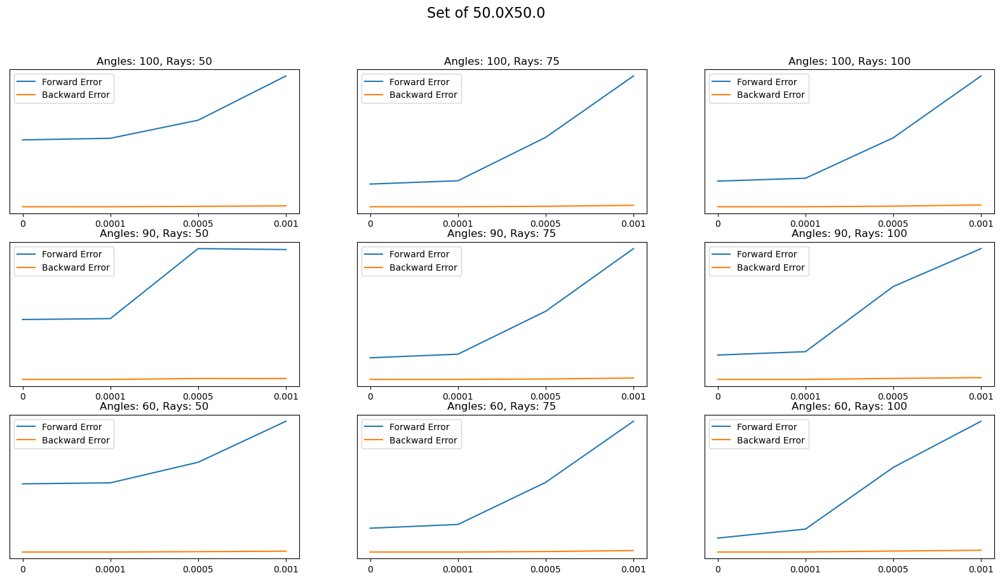

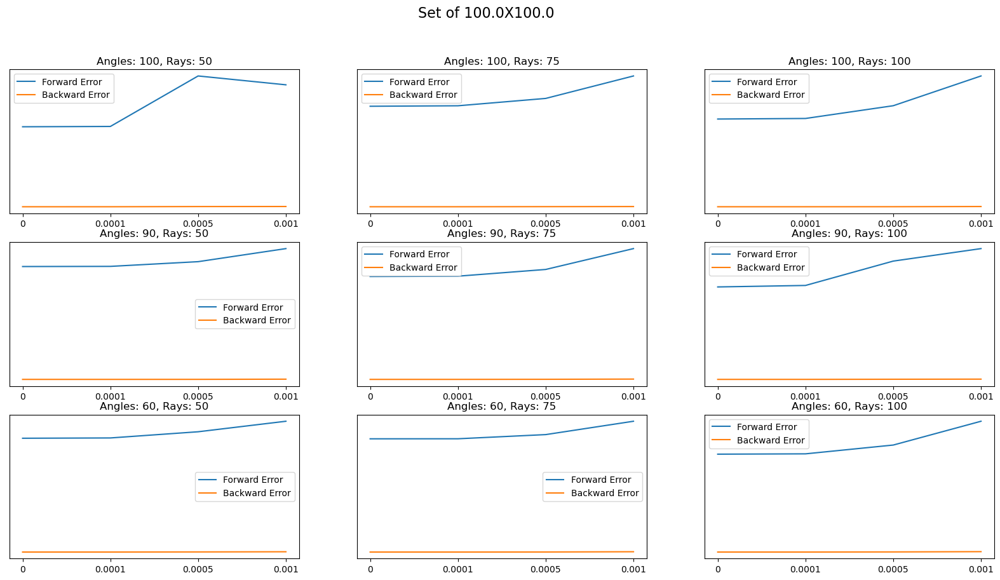

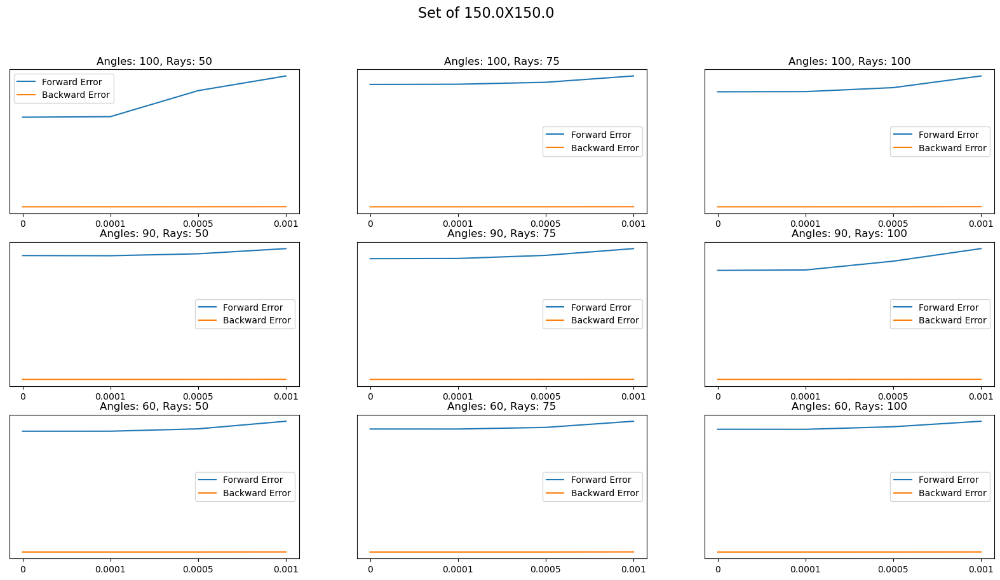

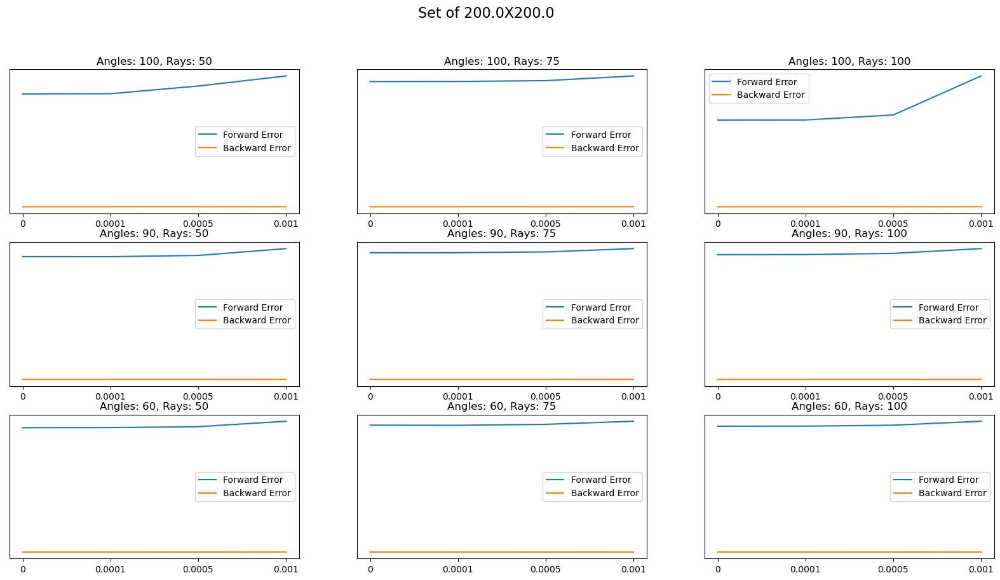

In [86]:
n=0
resample_x = [100,200,300,400]

angles = [100,100,100,90,90,90,60,60,60]
#rays = [50,50,50,75,75,75,100,100,100]
rays = [50,75,100,50,75,100,50,75,100]
#amount of noise
noises = [0, 1e-4, 5e-4, 1e-3]

for i in testAS:

    fig, axs = plt.subplots(3,3, figsize=(20, 10), facecolor='w', edgecolor='k')
    fig.subplots_adjust(hspace = .2)
    fig.suptitle(f'Set of {resample_x[n]/2}X{resample_x[n]/2}', fontsize=16)
    plt.setp(axs, xticks=range(len(rel_back)), xticklabels=noises,
        yticks=[1, 2, 3])
    axs = axs.ravel()
    ax = 0 
    #w = 0
    for j in i:
        rel_back = [j[0][1],j[1][1], j[2][1], j[3][1]]
        rel_for = [j[0][2],j[1][2], j[2][2], j[3][2]]
        x = range(len(rel_back))
        axs[ax].plot(x,rel_for, label='Forward Error')
        axs[ax].plot(x,rel_back, label='Backward Error')
        #xticks(noises)
        axs[ax].legend()
        axs[ax].set_title(f'Angles: {angles[ax]}, Rays: {rays[ax]}')
        
        
        ax+=1
    
    n+=1

## Artificial Data

Value: 0.0, Count: 5365197
Value: 0.0008496388523324683, Count: 19630608
Value: 0.0037101005066195736, Count: 1257
Value: 0.05397851616202787, Count: 2938


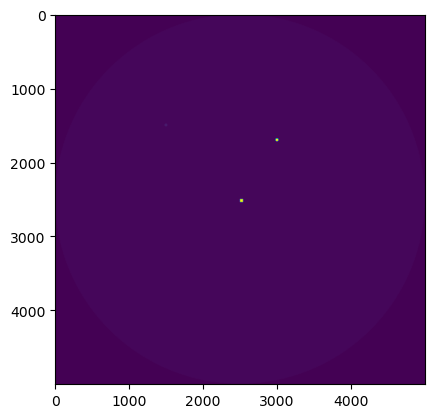

In [64]:
import numpy as np

# Load the NumPy array from the file
array_data = np.load('testImage.npy')

# Define the material value to extract
material_value = 0.05397851616202787

# Find the indices of the material value
indices = np.where(array_data == material_value)

# Extract the shape of the material
min_x, min_y = np.min(indices, axis=1)
max_x, max_y = np.max(indices, axis=1)
material_shape = (max_x - min_x + 1, max_y - min_y + 1)

# Choose a new position to add the extracted shape
new_position = (2500,2500)

# Assign the material value to the new position in the array
array_data[new_position[0]:new_position[0]+material_shape[0],
           new_position[1]:new_position[1]+material_shape[1]] = material_value

# Get the unique values and their counts
unique_values, value_counts = np.unique(array_data, return_counts=True)

# Print the unique values and their counts
for value, count in zip(unique_values, value_counts):
    print(f"Value: {value}, Count: {count}")
    
# Print the modified array
#img = Image.fromarray(array_data)
#img = img.resize((50,50), Image.LANCZOS)
plt.imshow(array_data)
plt.show()

C:\Users\Owner\AppData\Local\Temp\ipykernel_13468\1641601906.py:3: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  imgA = imgA.resize((50,50), Image.LANCZOS)


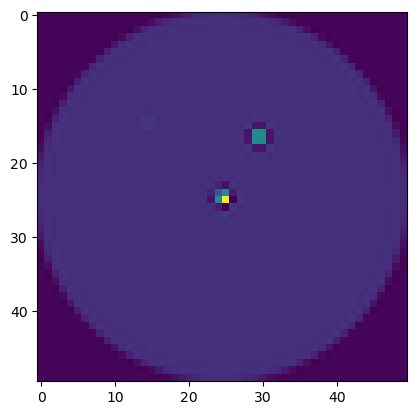

In [65]:
imgA = Image.fromarray(array_data)
# Resize the image from 5000x5000 pixels to 50x50 pixels
imgA = imgA.resize((50,50), Image.LANCZOS)

# Convert image again from PIL to numpy
img_array = np.array(imgA)
plt.imshow(img_array)
plt.show()

Grid of 75 X 75
Iteration 0,  ||residual|| = 0.42
Iteration 0,  ||residual|| = 0.42
Iteration 0,  ||residual|| = 0.44
Iteration 0,  ||residual|| = 0.45
Iteration 0,  ||residual|| = 0.21
Iteration 0,  ||residual|| = 0.21
Iteration 0,  ||residual|| = 0.21
Iteration 0,  ||residual|| = 0.21
1 / 2
Iteration 0,  ||residual|| = 0.47
Iteration 0,  ||residual|| = 0.47
Iteration 0,  ||residual|| = 0.46
Iteration 0,  ||residual|| = 0.48
Iteration 0,  ||residual|| = 0.23
Iteration 0,  ||residual|| = 0.23
Iteration 0,  ||residual|| = 0.23
Iteration 0,  ||residual|| = 0.24
2 / 2
Grid of 100 X 100
Iteration 0,  ||residual|| = 0.66
Iteration 0,  ||residual|| = 0.66
Iteration 0,  ||residual|| = 0.67
Iteration 0,  ||residual|| = 0.66
Iteration 0,  ||residual|| = 0.65
Iteration 0,  ||residual|| = 0.65
Iteration 0,  ||residual|| = 0.65
Iteration 0,  ||residual|| = 0.65
1 / 2
Iteration 0,  ||residual|| = 0.74
Iteration 0,  ||residual|| = 0.74
Iteration 0,  ||residual|| = 0.74
Iteration 0,  ||residual|| = 0

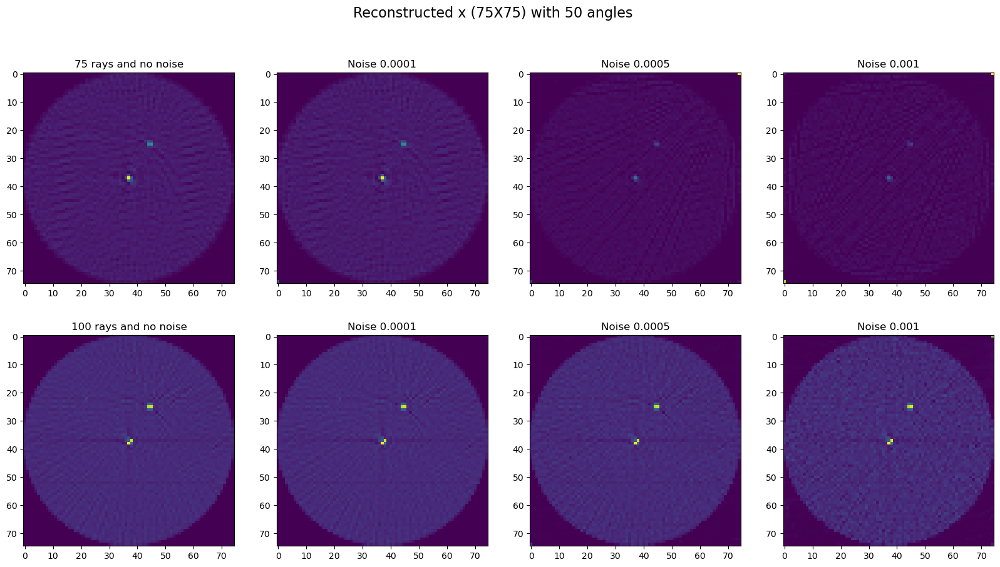

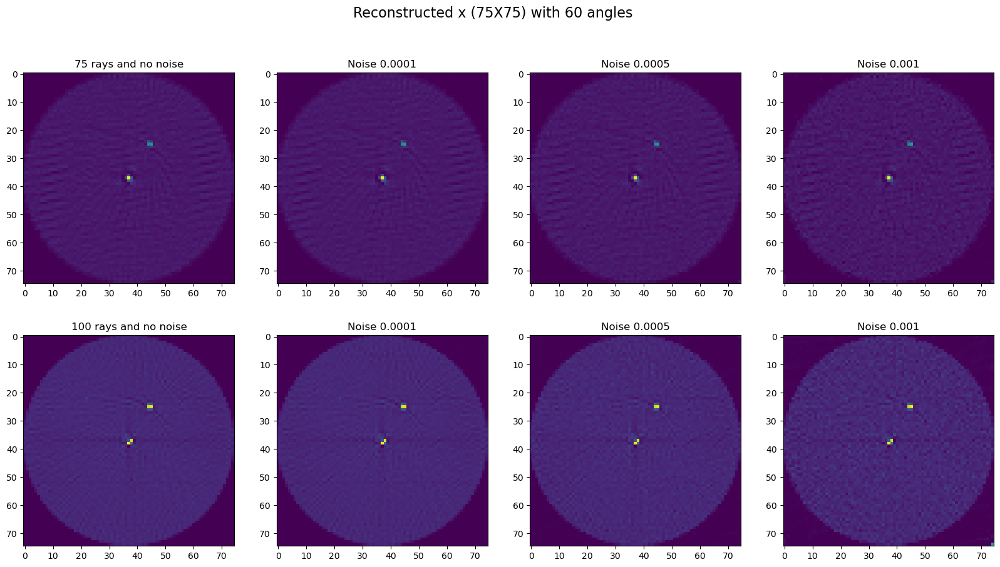

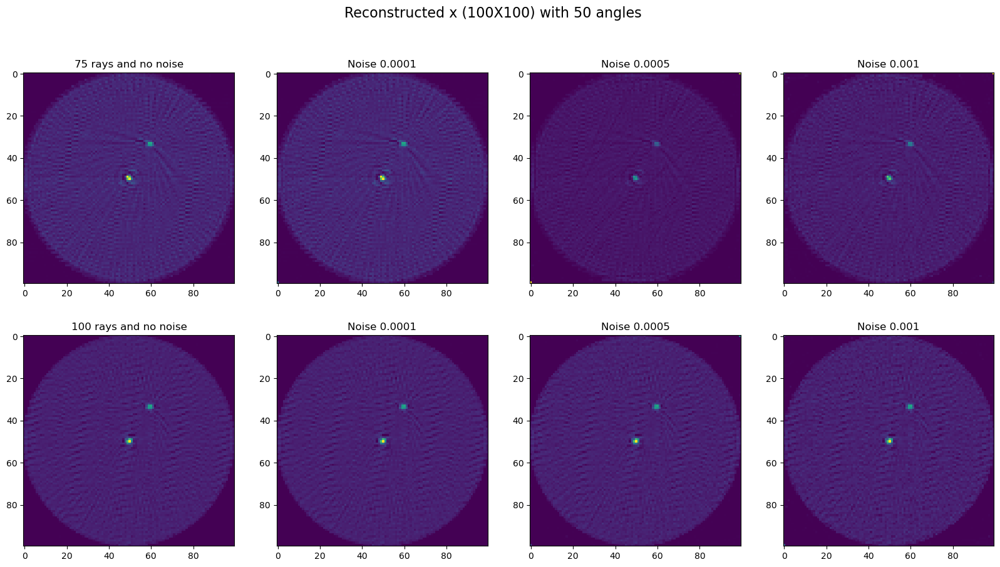

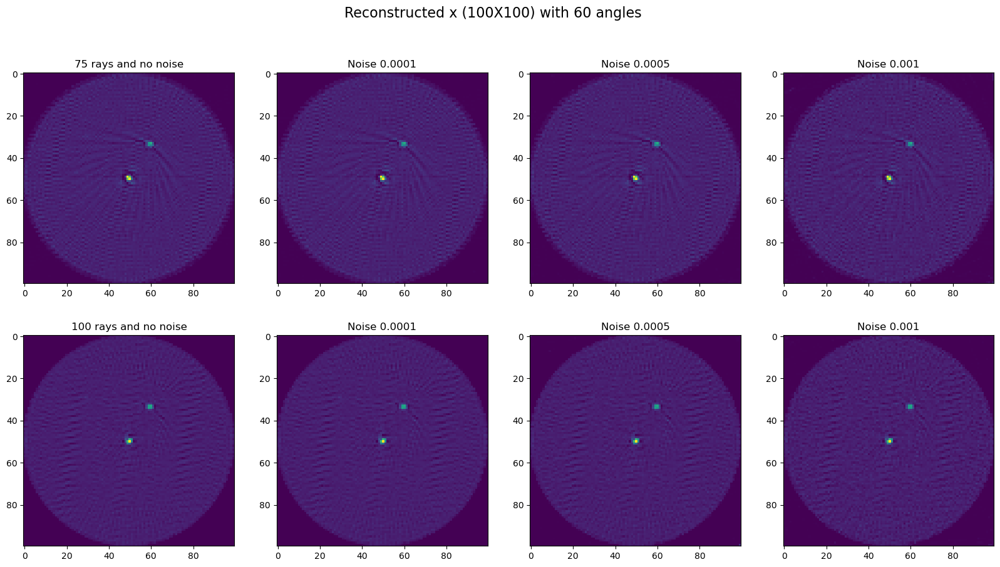

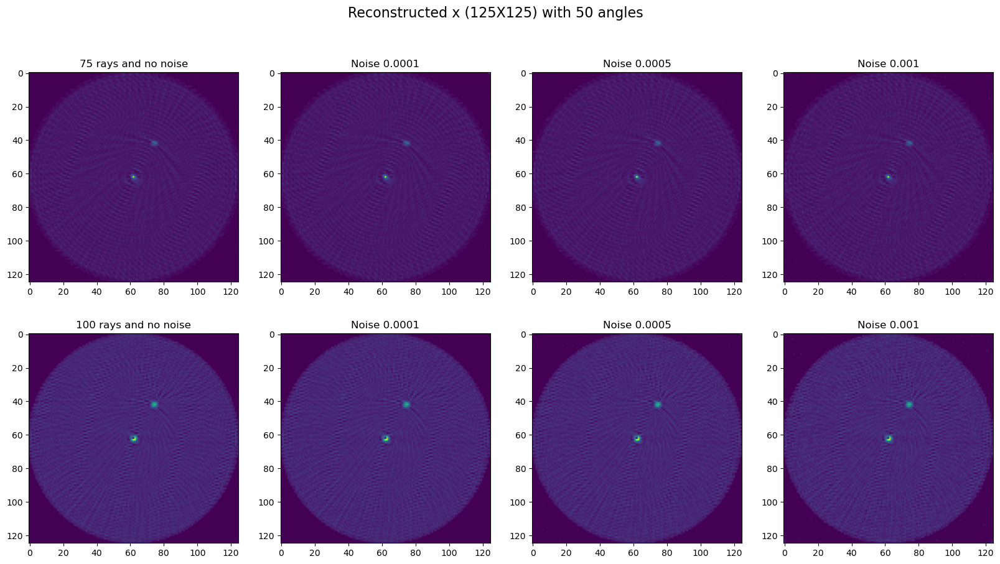

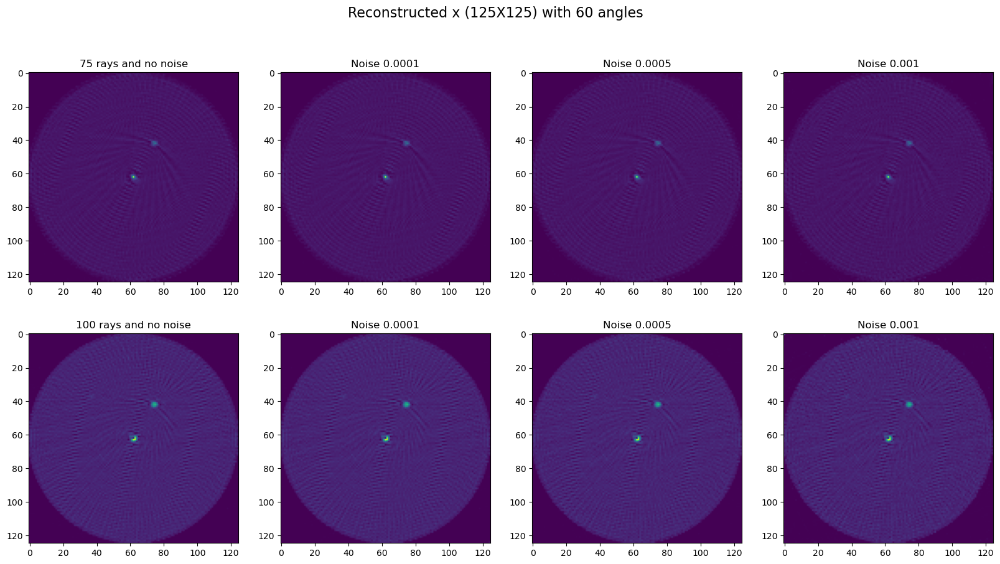

In [88]:
# Load the image with lead and steel shot
import matplotlib.pyplot as plt
import airtools

# Load image and convert it to a PIL Image object
img_array = array_data
img = Image.fromarray(img_array)

#Parameters to resample x, the values divided by 2 give N, to form an NXN grid
# for example, first value 50 will give a 25x25 grid
#modify and/or add as you want, just note that the bigger the grid the more it will last running

resample_x = [150,200,250]

testA1 = []

for i in resample_x:

    L = int(i/2)
    # Resize the image from 5000x5000 pixels to 50x50 pixels
    img = img.resize((L, L), Image.Resampling.LANCZOS)

    # Convert image again from PIL to numpy
    img_array = np.array(img)
    x=img_array.flatten()
    N = img_array.shape[0]
    print(f'Grid of {L} X {L}')
    
    #You can modify and/or add more variations for the next parameters
    
    
    #These are the number of angles that we may use, we will later on use np.linspace() that will give a number 
    # values between 0 and 180

    angles = [50,60]
    
    #number of rays for each angle
    rays = [75,100]
    
    #amount of noise
    noises = [1e-4, 5e-4, 1e-3]
    
    #ignore
    pt=0
    testA11 = []
    
    for j in angles:
        
        #create figure for subplots for each number of angles
        fig, axs = plt.subplots(len(rays),len(noises)+1, figsize=(20, 10), facecolor='w', edgecolor='k')
        fig.subplots_adjust(hspace = .2)
        fig.suptitle(f'Reconstructed x ({L}X{L}) with {j} angles', fontsize=16)
        axs = axs.ravel()
        ax = 0
        
        for n in rays:
            
            #set parameters for paralleltomo
            
            theta_i = np.matrix(np.linspace(0,180,j))
            p=n
            
            #paralleltomo
            [A,thetar,pr,d] = paralleltomo.paralleltomo(N, theta_i, p)
            
            #obtain b
            b=np.dot(A,x)
            
            A, b, som = airtools.rzr(A,b)
            #condA = np.linalg.cond(A)
            x_reconstructed, residuals = airtools.kaczmarz(A,b)
            condA = np.linalg.cond(A, 2)
            #print(f'condition number: {cond}')

            r_v = (A@x_reconstructed)-b
            A_inv = np.linalg.pinv(A)
            deltax_norm= (np.linalg.norm(-A_inv@r_v))
            rel_res = (np.linalg.norm(r_v))/((np.linalg.norm(A))*(np.linalg.norm(x)))               
            rel_error = (np.linalg.norm(deltax_norm))/(np.linalg.norm(x))
            #EMF = rel_error/rel_res
            #print(f'Condition number of A with N = {N}, nA = {j}, p = {p}: {condA}')
            #print(f'Relative error of reconstructed x: {rel_error}')
            #print(f'Relative residual: {rel_res} ')
            testA11.append([condA, rel_res, rel_error])
            #x_reconstructed, residuals = airtools.kaczmarz(A,b)
            
            orig_shape = (N, N)
            # reshape the flattened image to the original shape
            recovered_img_x = x_reconstructed.reshape(orig_shape)
            # convert the image back to PIL Image format
            recovered_img_x = np.array(recovered_img_x)
        
            
            axs[ax].imshow(recovered_img_x )
            axs[ax].set_title(f'{p} rays and no noise')
            #sensitivity = np.linalg.cond(A)

    
            ax+=1
            for a in noises:
                
              #ADD NOISE
                noise=np.random.normal(0,a, b.shape)
                b_noise= b + noise
                A, b_noise, som = airtools.rzr(A,b_noise)
                
                x_noise, residuals = airtools.kaczmarz(A,b_noise)
                
                r_v = (A@x_noise)-b
                A_inv = np.linalg.pinv(A)
                deltax_norm= (np.linalg.norm(-A_inv@r_v))
                rel_res = (np.linalg.norm(r_v))/((np.linalg.norm(A))*(np.linalg.norm(x)))               
                rel_error = (np.linalg.norm(deltax_norm))/(np.linalg.norm(x))
                EMF = rel_error/rel_res
                #print(f'EMF with noise = {a}: {EMF}')
                #print(f'Relative error of reconstructed x: {rel_error}')
                #print(f'Relative residual: {rel_res} ')
                testA11.append([EMF, rel_res, rel_error])
                
                # reshape the flattened image to the original shape
                recovered_img_x_noise = x_noise.reshape(orig_shape)
                # convert the image back to PIL Image format
                recovered_img_x_noise = np.array(recovered_img_x_noise)
               
                axs[ax].imshow(recovered_img_x_noise)
                axs[ax].set_title(f'Noise {a}')
                ax+=1
        pt+=1
        print(f'{pt} / {len(angles)}')
        #pt+=1
        
    testA1.append([testA11])

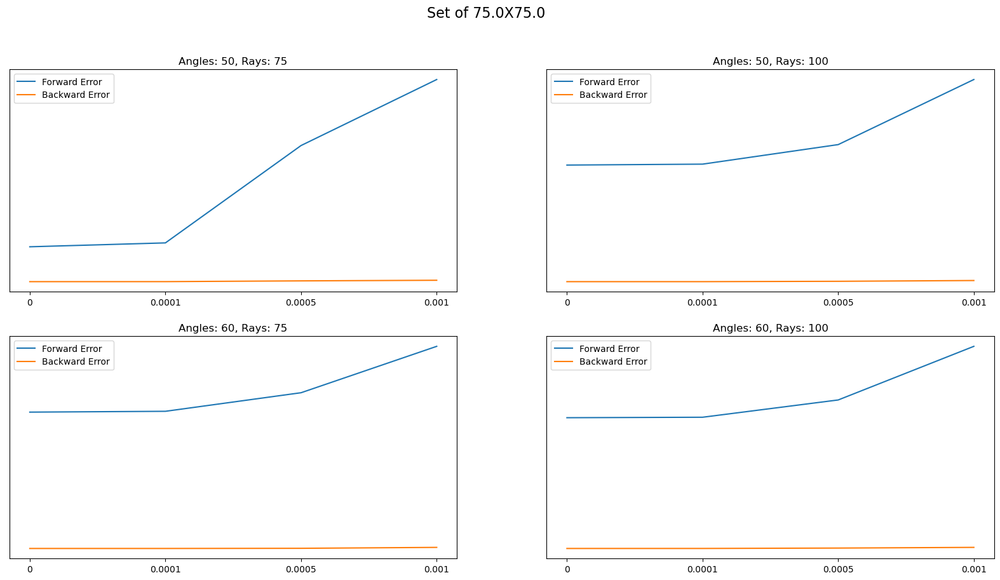

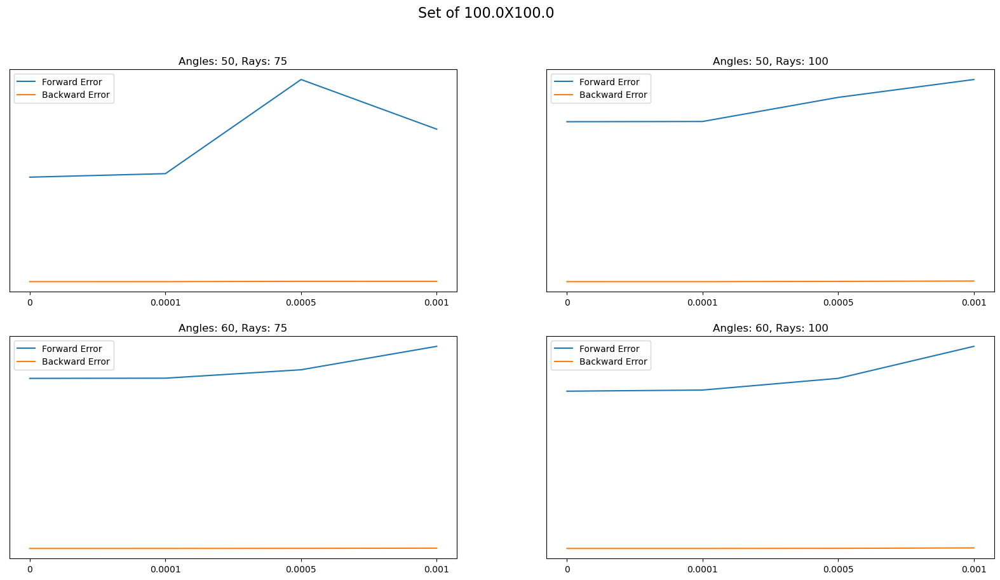

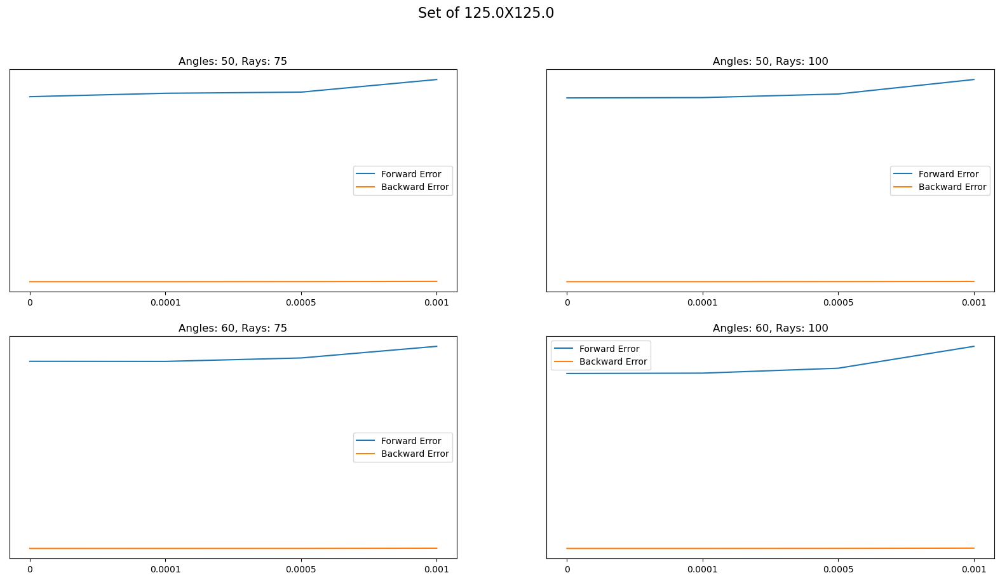

In [95]:
len(testA1[0][0])

import numpy as np
testAS1 = []
for i in testA1:
    for j in i:
        testj = np.array_split(j, len(j)//4)
    testAS1.append(testj)
    
n=0

resample_x = [150,200,250]
angles = [50,50,60,60]
rays = [75,100,75,100]

noises = [0,1e-4, 5e-4, 1e-3]

#resample_x = [100,200,300,400]

#angles = [100,100,100,90,90,90,60,60,60]
#rays = [50,50,50,75,75,75,100,100,100]
#rays = [50,75,100,50,75,100,50,75,100]
#amount of noise
#noises = [0, 1e-4, 5e-4, 1e-3]

for i in testAS1:

    fig, axs = plt.subplots(2,2, figsize=(20, 10), facecolor='w', edgecolor='k')
    fig.subplots_adjust(hspace = .2)
    fig.suptitle(f'Set of {resample_x[n]/2}X{resample_x[n]/2}', fontsize=16)
    plt.setp(axs, xticks=range(len(rel_back)), xticklabels=noises,
        yticks=[1, 2, 3])
    axs = axs.ravel()
    ax = 0 
    #w = 0
    for j in i:
        rel_back = [j[0][1],j[1][1], j[2][1], j[3][1]]
        rel_for = [j[0][2],j[1][2], j[2][2], j[3][2]]
        x = range(len(rel_back))
        axs[ax].plot(x,rel_for, label='Forward Error')
        axs[ax].plot(x,rel_back, label='Backward Error')
        #xticks(noises)
        axs[ax].legend()
        axs[ax].set_title(f'Angles: {angles[ax]}, Rays: {rays[ax]}')
        
        
        ax+=1
    
    n+=1

http://www2.compute.dtu.dk/~pcha/AIRtoolsII/

https://reader.elsevier.com/reader/sd/pii/S0377042711005188?token=88D5903D423249F3954638A56A5CFCE9599BDC95CC84154B3BDBCACAE3FCEFA8CEBB98B8AD172C03C03135F7D8D5941F&originRegion=eu-west-1&originCreation=20230411085058

https://backend.orbit.dtu.dk/ws/portalfiles/portal/140598691/10.1007_2Fs11075_017_0430_x.pdf?fbclid=IwAR0kygJvFsCW7OFLcLnuL3T7FHpReAlFuU9XE8iGP96GRH2AXMbKybgyTMs

http://people.compute.dtu.dk/pcha/AIRtoolsII/

